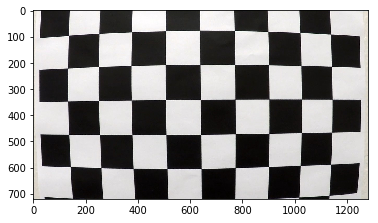

In [2]:
# calibrating a camera 

import numpy as np 
import cv2
import matplotlib
matplotlib.use('Qt5Agg')
import matplotlib.pyplot as plt 
import matplotlib.image as mpimg 
%matplotlib inline 


# read in a calibration image 

img = mpimg.imread('camera_cal/calibration1.jpg')
plt.imshow(img)

In [3]:
nx = 9 # number of the inside corners in x 
ny = 6 # number of the inside corners in y 

# Convert to grayscale 

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 

# Find the chessboard corners 

ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None) 

#print(ret)
#print(corners)

# if found, draw corners 



if ret == True: 
    
    # Draw and display the corners 
    cv2.drawChessboardCorners(img, (nx, ny), corners, ret) 
    plt.imshow(img)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17


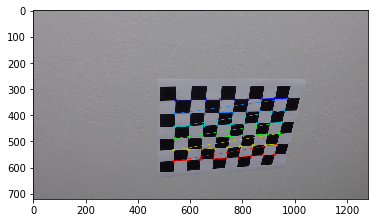

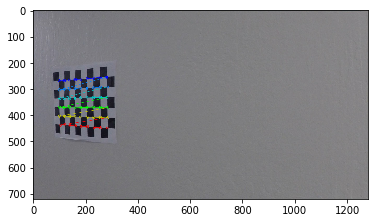

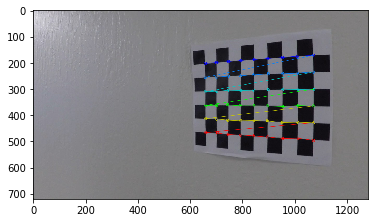

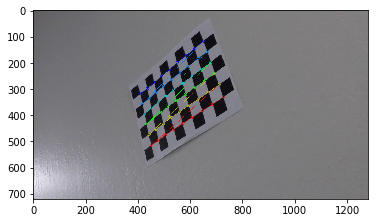

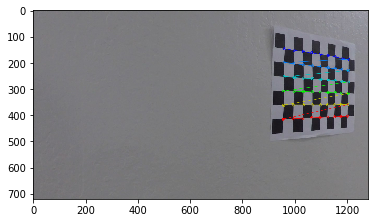

...

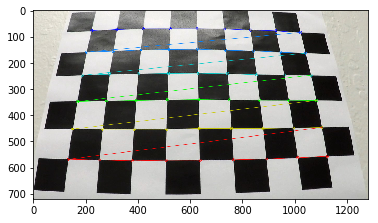

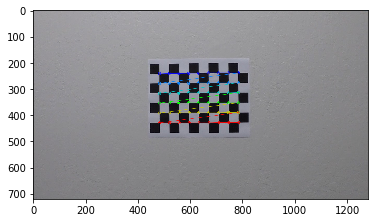

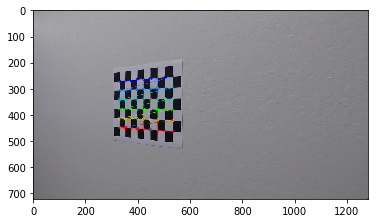

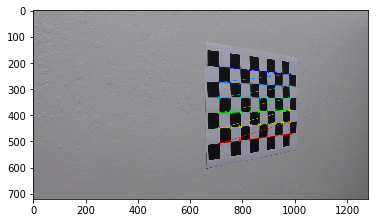

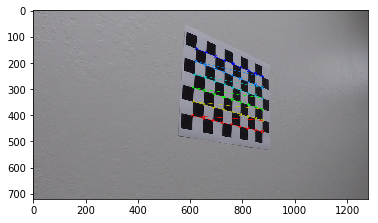

In [4]:
# undistorting 
# read in a calibration image 
import glob 

images = glob.glob('camera_cal/calibration*.jpg')

nx = 9 # number of the inside corners in x 
ny = 6 # number of the inside corners in y 

objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

# prepare objpoints like (x,y,z) = (0,0,0), ... (nx - 1, ny -1 , 0)
objp = np.zeros((ny*nx,3), np.float32) # 3D 
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) # x,y coordinates 

i = 0 
for fname in images: 
 
    # read in each images 
    img = mpimg.imread(fname)

    # convert image to grayscale 
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
    
    # find the chessboard corners 
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)


    # if conners are found, add object points, image points

    if ret == True: 
        i = i + 1
        imgpoints.append(corners) 
        objpoints.append(objp) 
        # draw and display the corners 
        img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret) 
        print(i)
        plt.figure(i)
        plt.imshow(img)   


In [5]:
# use the object and image points to calibrate the camera and compute the camera matrix and distortion coefficients
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)






calibration2.jpg
checked for shape


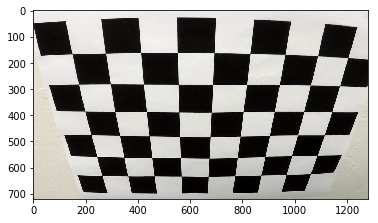

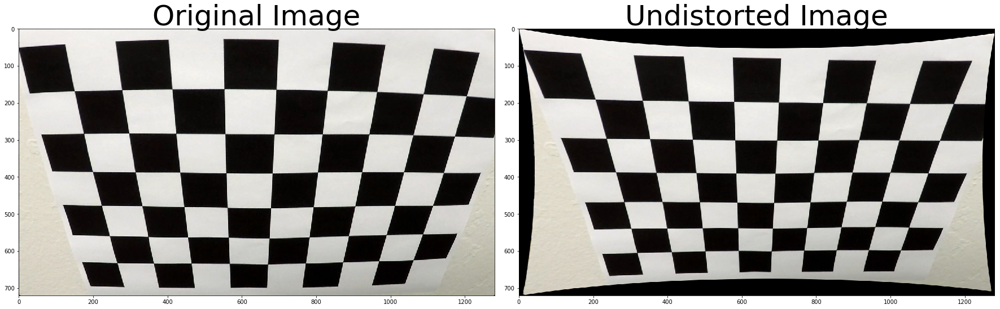

In [6]:
#pick one image for testing 
img = mpimg.imread('camera_cal/calibration2.jpg')
print("calibration2.jpg")
plt.imshow(img)

try:
    img.shape
    print("checked for shape".format(img.shape))
except AttributeError:
    print("shape not found")
    #code to move to next frame
    
h,  w = img.shape[:2]

newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))

undistorted = cv2.undistort(img, mtx, dist, None, newcameramtx)


f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

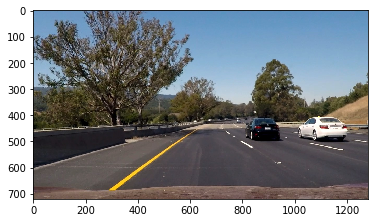

In [7]:
# Pipeline (single images)  

#pick one image for testing 
image = mpimg.imread('test_images/test6.jpg')
plt.imshow(image)


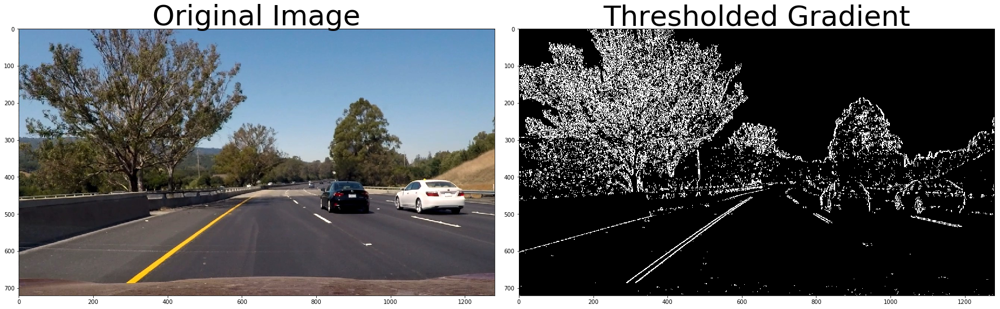

In [8]:
# we have four steps to perform: 
# 1. camera calibration 
# 2. distortion correction 
# 3. color & gradient threshold 
# 4. perspective transform 

# After doing these steps, you’ll be given two additional steps for the project:

# 5. Detect lane lines
# 6. Determine the lane curvature
###################################################################################################
# binary images color transforms, gradients or other methods to create a thresholded binary image. 
# binary output 
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255): 
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel)) 
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    
    return binary_output 

# Run the function
grad_binary = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


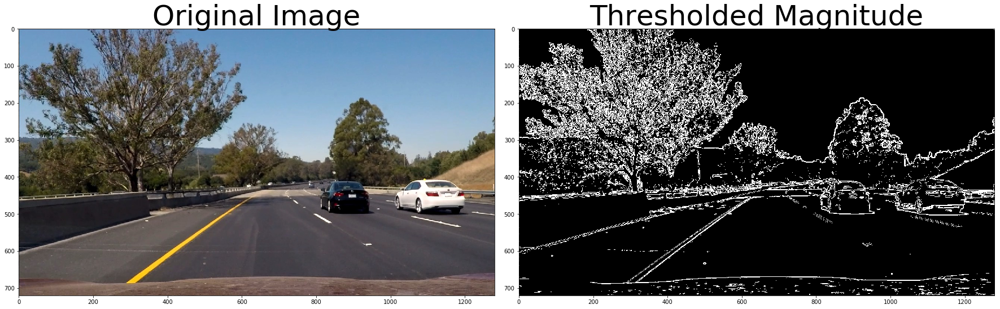

In [9]:
# Magnitude of the Gradient

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)): 
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 5) Create a binary mask where mag thresholds are met
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    
    return binary_output

# Run the function
mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


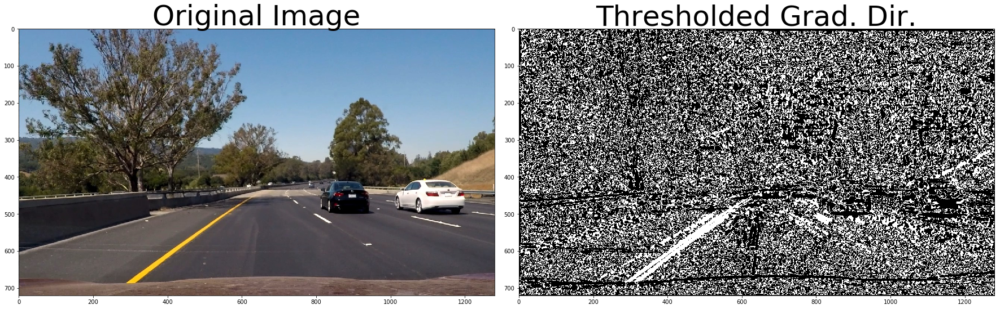

In [10]:
# Direction of the Gradient

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    
    return binary_output
    
# Run the function
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


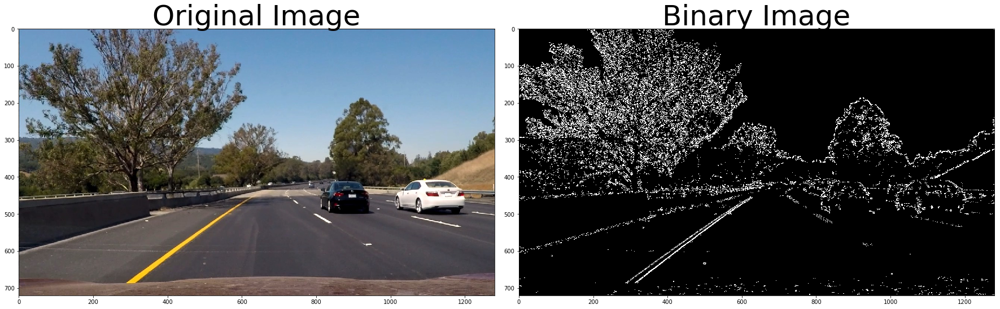

In [11]:
# combine these techniques above: 

# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100)
grady = abs_sobel_thresh(image, orient='y', thresh_min=20, thresh_max=100)
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 100))
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Binary Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

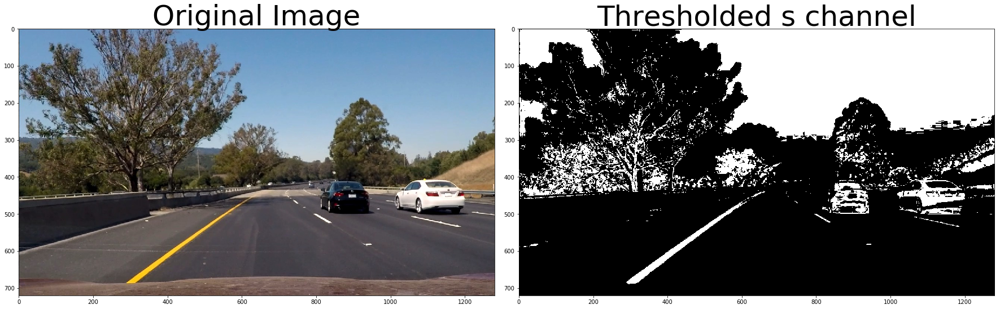

In [12]:
# HLS Color Threshold

def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    # 2) Apply a threshold to the S channel
    # 3) Return a binary image of threshold result
    # binary_output = np.copy(img) # placeholder line
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    
    return binary_output
    

hls_binary = hls_select(image, thresh=(90, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(hls_binary, cmap='gray')
ax2.set_title('Thresholded s channel', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

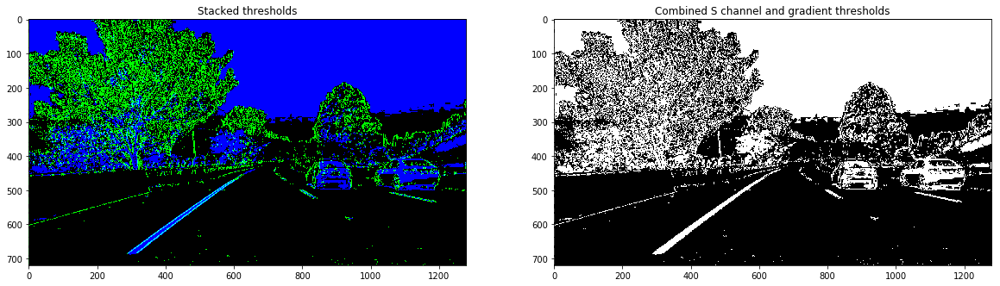

In [13]:
#combined color (s channel) and gradient thresholds
hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
s_channel = hls[:,:,2]

# Grayscale image
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Sobel x
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

# Threshold x gradient
thresh_min = 20
thresh_max = 100
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

# Threshold color channel
s_thresh_min = 90
s_thresh_max = 255
s_binary = np.zeros_like(s_channel)
s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

# Stack each channel to view their individual contributions in green and blue respectively
# This returns a stack of the two binary images, whose components you can see as different colors
color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

# Combine the two binary thresholds
combined_binary = np.zeros_like(sxbinary)
combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(color_binary)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(combined_binary, cmap='gray')

In [14]:
def perspective_transform(image): 
    #initialize the perspective transform matrix
    M = None
    warped = np.copy(image)
    image_width = image.shape[1]
    image_height = image.shape[0]
    margin = 200
    #print(image.shape)

   
    src = np.float32([[540, 470],[750, 470],[1130, 690],[200, 690]])
    dst = np.float32([[200, 0],[1080, 0],[1080, 720],[200, 720]])
    
    #print("[Perspective Transform] Source: %s" %src)
    #print("[Perspective Transform] Destination: %s" %dst)

    # use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(image, M, (image_width, image_height))
    
    return M, warped

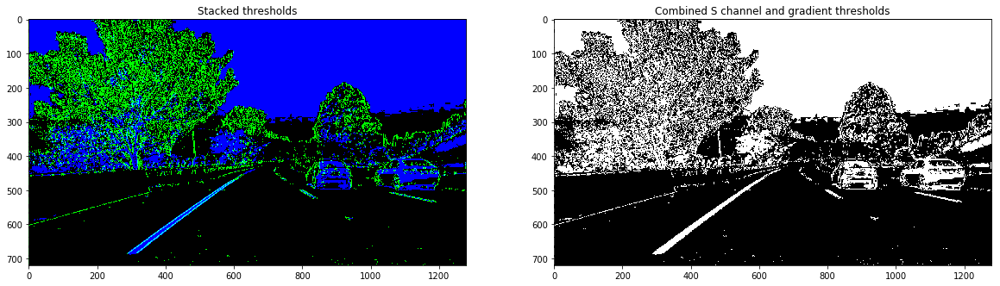

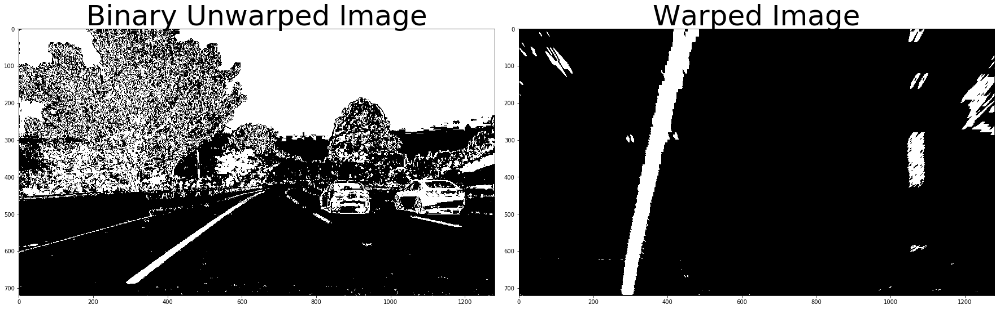

In [15]:
#combined color (s channel) and gradient thresholds
hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
s_channel = hls[:,:,2]

# Grayscale image
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Sobel x
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

# Threshold x gradient
thresh_min = 20
thresh_max = 100
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

# Threshold color channel
s_thresh_min = 90
s_thresh_max = 255
s_binary = np.zeros_like(s_channel)
s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

# Stack each channel to view their individual contributions in green and blue respectively
# This returns a stack of the two binary images, whose components you can see as different colors
color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

# Combine the two binary thresholds
combined_binary = np.zeros_like(sxbinary)
combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(color_binary)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(combined_binary, cmap='gray')

unwarped = combined_binary
M, warped = perspective_transform(unwarped)    

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(unwarped,"gray")
ax1.set_title('Binary Unwarped Image', fontsize=50)
ax2.imshow(warped,"gray")
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

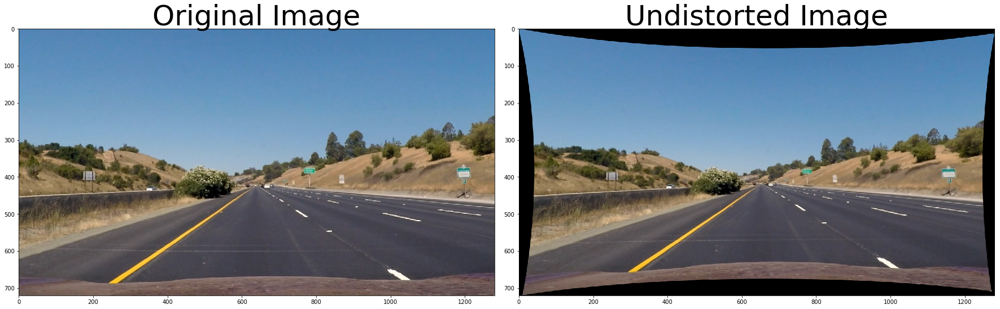

In [16]:
# Pipeline (single images)  
from PIL import Image
with Image.open('test_images/straight_lines1.jpg') as img:
    w, h = img.size


# undistorted image
image = mpimg.imread('test_images/straight_lines1.jpg')

newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))

undistorted_image = cv2.undistort(image, mtx, dist, None, newcameramtx)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted_image)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [17]:
# apply perspective transfrom 

def getBirdEyeView(undistorted_image): 
    #initialize the perspective transform matrix
    M = None
    warped = np.copy(undistorted_image)
    image_width = undistorted_image.shape[1]
    image_height = undistorted_image.shape[0]
    margin = 200
    #print(image.shape)

    # define source points
    #src = np.float32([[(178, 660), (620, 441), (722, 441), (1130, 660)]])
   
    # set dst points
    #dst = np.float32([[(350, 660), (350, 0), (980, 0), (980, 660)]])


    
    #src = np.float32([[540, 470],[750, 470],[1130, 690],[200, 690]])
    #dst = np.float32([[200, 0],[1080, 0],[1080, 720],[200, 720]])
    
    
    #src = np.float32([[(200, 720), (570, 470), (720, 470), (1130, 720)]])
    #dst = np.float32([[(350, 720), (350, 0), (980, 0), (980, 720)]])
    
    #src = np.float32([[570,468],  [714,468], [1106,720], [207,720]])
    #bottom_left = [320,720] 
    #bottom_right = [920, 720]
    #top_left = [320, 1]
    #top_right = [920, 1]
    #dst = np.float32([top_left,top_right,bottom_right, bottom_left])
    
    
    #src = np.float32([[540, 470],[750, 470],[1130, 690],[200, 690]])
    
    #dst = np.float32([[200, 200],[1080, 0],[1080, 720],[200, 720]])
    
    #src = np.float32([[(200, 720), (570, 470), (720, 470), (1130, 720)]])
    #dst = np.float32([[(350, 720), (350, 0), (980, 0), (980, 720)]])

    #bottom_left_src  = [200, 690] 
    #bottom_right_src = [1130, 690] 
    #top_left_src     = [540, 470]
    #top_right_src    = [750, 470]
    #src = np.float32([top_left_src,top_right_src,bottom_right_src, bottom_left_src])
    
    
    
    
    #bottom_left_dst  = [200,720] 
    #bottom_right_dst = [1080, 720]
    #top_left_dst     = [150, 0]
    #top_right_dst    = [1300, 0]
    #dst = np.float32([top_left_dst,top_right_dst,bottom_right_dst, bottom_left_dst])
    
    src = np.float32([[(200, 720), (570, 470), (720, 470), (1130, 720)]])
    dst = np.float32([[(350, 720), (350, 0), (980, 0), (980, 720)]])

    
    #print("[Perspective Transform] Source: %s" %src)
    #print("[Perspective Transform] Destination: %s" %dst)

    # use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(image, M, (image_width, image_height))
    
    return M, warped

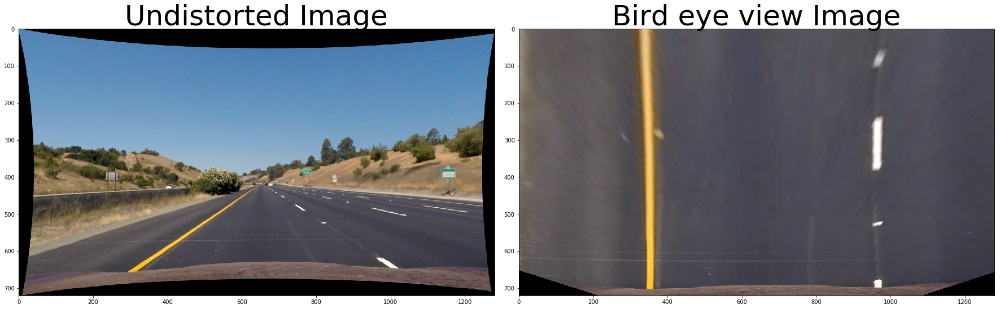

In [18]:

M, birdEyeView_image = getBirdEyeView(undistorted_image)    

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistorted_image)
ax1.set_title('Undistorted Image', fontsize=50)
ax2.imshow(birdEyeView_image)
ax2.set_title('Bird eye view Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

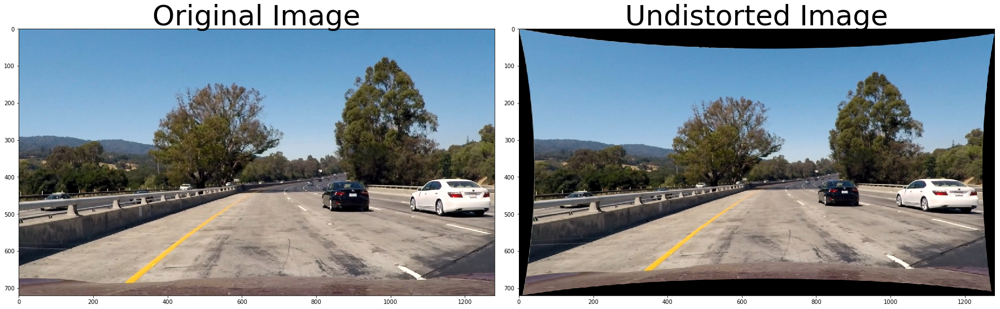

In [19]:
# test of straight line 
# Pipeline (single images)  
from PIL import Image
with Image.open('test_images/test1.jpg') as img:
    w, h = img.size


# undistorted image
image = mpimg.imread('test_images/test1.jpg')

newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))

undistorted_image = cv2.undistort(image, mtx, dist, None, newcameramtx)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted_image)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

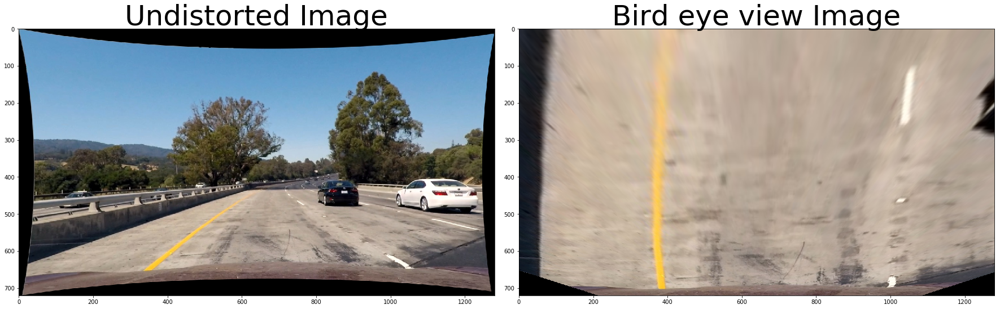

In [20]:
M, birdEyeView_image = getBirdEyeView(undistorted_image)    

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistorted_image)
ax1.set_title('Undistorted Image', fontsize=50)
ax2.imshow(birdEyeView_image)
ax2.set_title('Bird eye view Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [21]:
def combine_threshold(x, y): 
    combined = np.zeros_like(x)
    combined[((x == 1) & (y == 1))] = 1
    
    return combined 


yellow_low  = np.array([0, 80, 200])
yellow_high = np.array([40, 255, 255])
white_low  = np.array([20, 0, 200])
white_high = np.array([255, 255, 255])

def hsv_range(image, thresh=(np.array([0, 0, 0]), np.array([255, 255, 255]))): 
    """ Convert RGB image to HSV color space and filter in that space """ 
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV) 
    mask = cv2.inRange(hsv, thresh[0], thresh[1]) 
    mask[mask > 0] = 1

    return mask

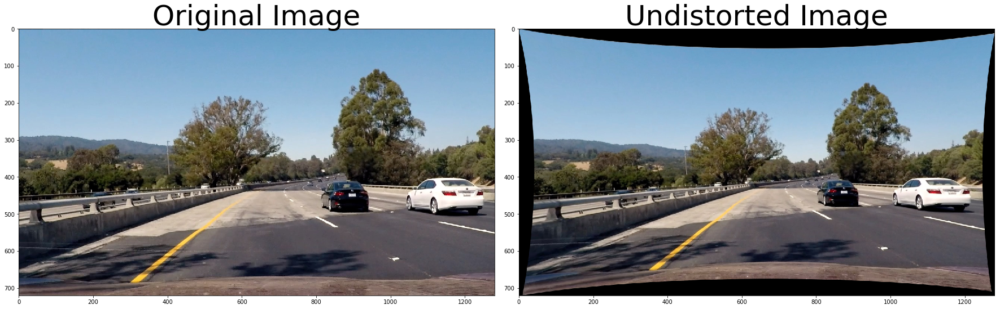

In [22]:
#Start WORKING ON PIPELINE 
# test of test4
# Pipeline (single images)  
from PIL import Image
with Image.open('test_images/test4.jpg') as img:
    w, h = img.size


# undistorted image
image = mpimg.imread('test_images/test4.jpg')

newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))

undistorted_image = cv2.undistort(image, mtx, dist, None, newcameramtx)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted_image)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

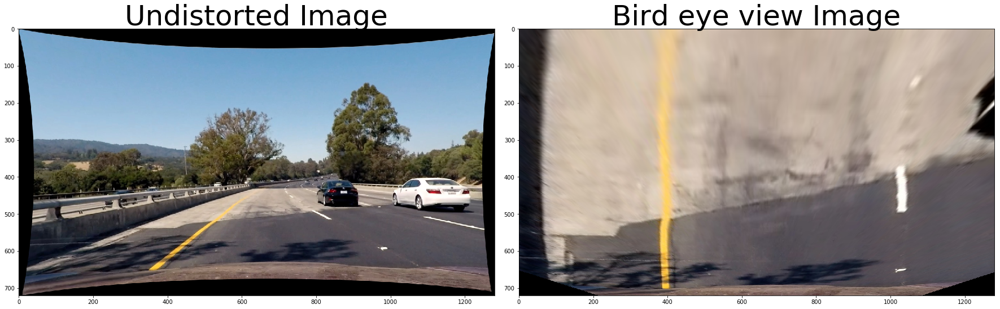

In [75]:
Mbird, birdEyeView_image = getBirdEyeView(undistorted_image)    

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistorted_image)
ax1.set_title('Undistorted Image', fontsize=50)
ax2.imshow(birdEyeView_image)
ax2.set_title('Bird eye view Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

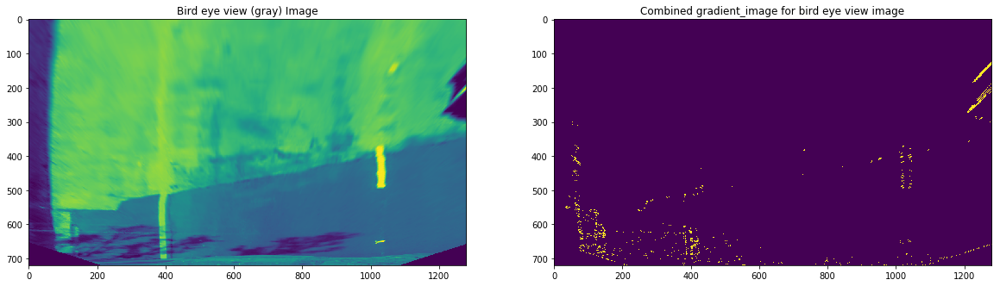

In [76]:

# Grayscale image
gray = cv2.cvtColor(birdEyeView_image, cv2.COLOR_RGB2GRAY)

gradx = abs_sobel_thresh(birdEyeView_image, orient='x', thresh_min=20, thresh_max=100)
grady = abs_sobel_thresh(birdEyeView_image, orient='y', thresh_min=20, thresh_max=100)
combined = combine_threshold(gradx, grady)

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Bird eye view (gray) Image')
ax1.imshow(gray)

ax2.set_title('Combined gradient_image for bird eye view image')
ax2.imshow(combined)

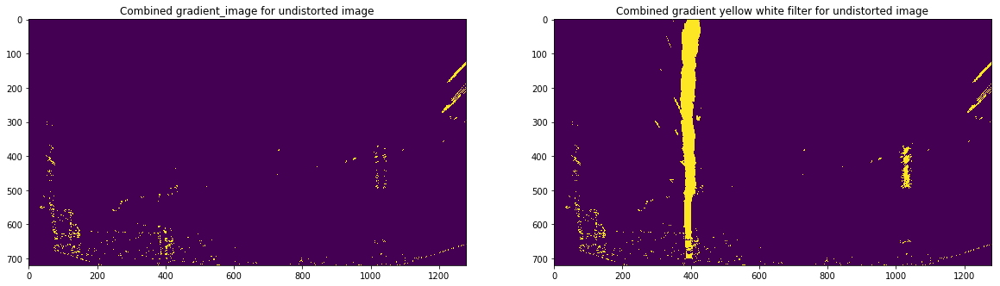

In [77]:
y_filter = hsv_range(birdEyeView_image, (yellow_low, yellow_high))
w_filter = hsv_range(birdEyeView_image, (white_low, white_high))

binary_image = np.zeros_like(gradx)
binary_image[(combined == 1) | (y_filter == 1) | (w_filter == 1)] = 1

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Combined gradient_image for undistorted image')
ax1.imshow(combined)

ax2.set_title('Combined gradient yellow white filter for undistorted image')
ax2.imshow(binary_image)

In [78]:
binary_warped = binary_image


histogram = np.sum(binary_warped[np.int(binary_warped.shape[0]/2):,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
    (0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
    (0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)



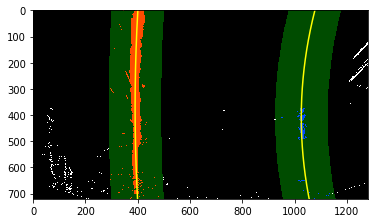

In [79]:
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100

left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
left_fit[1]*nonzeroy + left_fit[2] + margin))) 

right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)


# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Define y-value where we want radius of curvature
# I'll choose the maximum y-value, corresponding to the bottom of the image
#y_eval = np.max(ploty)/2

y_eval = np.max(ploty)
y_eval = y_eval*ym_per_pix
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])


# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])



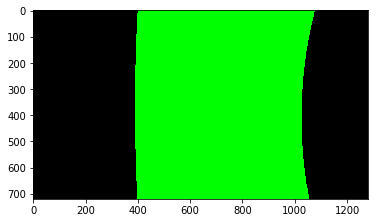

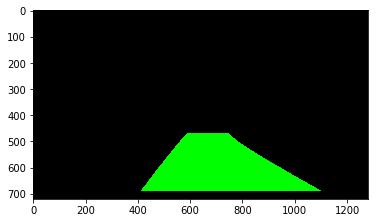

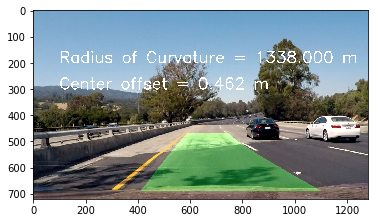

In [80]:
centerpos = binary_warped.shape[1]/2
lane_center = (right_fitx[719] + left_fitx[719])/2
center_offset_pixels = abs(centerpos - lane_center)

aver_curverad = int(left_curverad+right_curverad)/2.0+0.5
offset = center_offset_pixels*xm_per_pix
    

src = np.float32([[540, 470],[750, 470],[1130, 690],[200, 690]])
dst = np.float32([[200, 0],[1080, 0],[1080, 720],[200, 720]])    
    
M = cv2.getPerspectiveTransform(src, dst)

Minv = cv2.getPerspectiveTransform(dst, src)

binary_warped = binary_image

 # Create an image to draw the lines on
warp_zero = np.zeros_like(binary_warped).astype(np.uint8) 
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))
# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
plt.imshow(color_warp)
plt.show()
# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
plt.imshow(newwarp)
plt.show()
# Combine the result with the original image
result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
texted_image =cv2.putText(img=np.copy(result), text= 'Radius of Curvature = %.3f m'%(aver_curverad), org=(100,200),
fontFace=0, fontScale=2, color=(255,255,255), thickness=3)

texted_image =cv2.putText(texted_image, text= 'Center offset = %.3f m'%(offset), org=(100,300),
fontFace=0, fontScale=2, color=(255,255,255), thickness=3)

plt.imshow(texted_image)
plt.show()
